In [24]:
!pip install pandas-profiling

In [130]:
!pip install xgboost --upgrade

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import xgboost as xgb
import matplotlib.pyplot as plt

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/playground-series-s3e14/sample_submission.csv
/kaggle/input/playground-series-s3e14/train.csv
/kaggle/input/playground-series-s3e14/test.csv


In [2]:
train_df = pd.read_csv("/kaggle/input/playground-series-s3e14/train.csv").drop(columns = ["id"])
train_df.head()

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417


In [27]:
profile = ProfileReport(train_df, title="Wild Blueberry Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Drop Correlated Variables

In [3]:
#From https://www.kaggle.com/code/warriorwizard/ps3e14-prediction-of-wild-blueberry-yield?scriptVersionId=129633058&cellId=16
def generate_features(df):
    df["fruit_seed"] = df["fruitset"] * df["seeds"]
    df['insects'] = df['honeybee'] + df['bumbles'] + df['andrena'] + df['osmia']
    df["AverageTRange"]=(df["AverageOfUpperTRange"]+df["AverageOfLowerTRange"])/2
    df["temperature_range"] = df["MaxOfUpperTRange"] - df["MinOfUpperTRange"] + df["MaxOfLowerTRange"] - df["MinOfLowerTRange"]
    df["rainfall_intensity"] = df["RainingDays"] * df["AverageRainingDays"]
    df["fruit_quality"] = df["fruitset"] * df["fruitmass"]
    df["seed_to_fruit_ratio"] = df["seeds"] / df["fruitmass"]
    
    temperature_ranges = ["MaxOfUpperTRange", "MinOfUpperTRange", "AverageOfUpperTRange","MaxOfLowerTRange", "MinOfLowerTRange", "AverageOfLowerTRange"]
    pca = PCA(n_components=1)
    df[["pca_temperature"]] = pca.fit_transform(df[temperature_ranges])
    
    return df

In [4]:
train_df = generate_features(train_df)
train_df

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,...,seeds,yield,fruit_seed,insects,AverageTRange,temperature_range,rainfall_intensity,fruit_quality,seed_to_fruit_ratio,pca_temperature
0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,...,32.460887,4476.81146,13.796231,2.00,49.70,53.5,9.36,0.177461,77.742172,21.840943
1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,...,33.858317,5548.12201,15.063846,1.75,49.70,53.5,9.36,0.187774,80.223209,21.840943
2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,...,38.341781,6869.77760,21.200199,1.76,61.35,66.0,9.36,0.260347,81.430491,-6.712083
3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,...,39.467561,6880.77590,22.337712,1.63,55.25,59.4,9.36,0.270614,82.544539,8.297096
4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,...,40.484512,7479.93417,23.467926,2.01,55.25,59.4,9.36,0.286456,81.925130,8.297096
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15284,12.5,0.25,0.25,0.38,0.50,77.4,46.8,64.7,55.8,27.0,...,40.546480,7667.83619,22.556079,1.38,55.25,59.4,4.16,0.264971,85.126522,8.297096
15285,12.5,0.25,0.25,0.25,0.50,86.0,52.0,71.9,62.0,30.0,...,29.467434,3680.56025,10.443643,1.25,61.35,66.0,19.04,0.137564,75.918566,-6.712083
15286,25.0,0.50,0.25,0.38,0.75,77.4,46.8,64.7,55.8,27.0,...,32.299059,4696.44394,13.647893,1.88,55.25,59.4,19.04,0.176112,77.495627,8.297096
15287,25.0,0.50,0.25,0.63,0.63,69.7,42.1,58.2,50.2,24.3,...,36.674243,6772.93347,19.883683,2.01,49.70,53.5,9.36,0.235374,84.477072,21.840943


In [5]:
cols_to_drop = ['MinOfUpperTRange', 'AverageOfUpperTRange', 'MaxOfLowerTRange', 'MinOfLowerTRange', 'AverageOfLowerTRange','AverageRainingDays']
train_df.drop(columns = cols_to_drop, inplace = True)
train_df.head()

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,RainingDays,fruitset,fruitmass,seeds,yield,fruit_seed,insects,AverageTRange,temperature_range,rainfall_intensity,fruit_quality,seed_to_fruit_ratio,pca_temperature
0,25.0,0.50,0.25,0.75,0.50,69.7,24.0,0.425011,0.417545,32.460887,4476.81146,13.796231,2.00,49.70,53.5,9.36,0.177461,77.742172,21.840943
1,25.0,0.50,0.25,0.50,0.50,69.7,24.0,0.444908,0.422051,33.858317,5548.12201,15.063846,1.75,49.70,53.5,9.36,0.187774,80.223209,21.840943
2,12.5,0.25,0.25,0.63,0.63,86.0,24.0,0.552927,0.470853,38.341781,6869.77760,21.200199,1.76,61.35,66.0,9.36,0.260347,81.430491,-6.712083
3,12.5,0.25,0.25,0.63,0.50,77.4,24.0,0.565976,0.478137,39.467561,6880.77590,22.337712,1.63,55.25,59.4,9.36,0.270614,82.544539,8.297096
4,25.0,0.50,0.25,0.63,0.63,77.4,24.0,0.579677,0.494165,40.484512,7479.93417,23.467926,2.01,55.25,59.4,9.36,0.286456,81.925130,8.297096


# Scale Data to 0-1 range

In [6]:

#x = train_df.loc[:, train_df. columns != "yield"].values
x = train_df.values
x_scaled = MinMaxScaler().fit_transform(x)
train_df_scaled = pd.DataFrame(x_scaled, columns = train_df.columns)
train_df_scaled.head()

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,RainingDays,fruitset,fruitmass,seeds,yield,fruit_seed,insects,AverageTRange,temperature_range,rainfall_intensity,fruit_quality,seed_to_fruit_ratio,pca_temperature
0,0.500000,0.027130,0.42735,1.000000,0.666667,0.000000,0.69697,0.505601,0.472087,0.423640,0.360383,0.330467,0.096841,0.000000,0.288168,0.488912,0.365825,0.344745,1.000000
1,0.500000,0.027130,0.42735,0.666667,0.666667,0.000000,0.69697,0.548911,0.492226,0.480664,0.512907,0.382081,0.083654,0.000000,0.288168,0.488912,0.403879,0.389235,1.000000
2,0.083333,0.013565,0.42735,0.840000,0.840000,0.654618,0.69697,0.784034,0.710344,0.663619,0.701073,0.631940,0.084182,0.656338,0.526718,0.488912,0.671668,0.410884,0.344334
3,0.083333,0.013565,0.42735,0.840000,0.666667,0.309237,0.69697,0.812440,0.742898,0.709558,0.702639,0.678257,0.077325,0.312676,0.400763,0.488912,0.709552,0.430861,0.688991
4,0.500000,0.027130,0.42735,0.840000,0.840000,0.309237,0.69697,0.842261,0.814536,0.751056,0.787942,0.724277,0.097368,0.312676,0.400763,0.488912,0.768007,0.419754,0.688991


In [7]:
labels = train_df.pop("yield")
features = train_df_scaled.drop(columns = ["yield"])



In [117]:
features

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,RainingDays,fruitset,fruitmass,seeds,fruit_seed,insects,AverageTRange,temperature_range,rainfall_intensity,fruit_quality,seed_to_fruit_ratio,pca_temperature
0,0.500000,0.027130,0.42735,1.000000,0.666667,0.000000,0.696970,0.505601,0.472087,0.423640,0.330467,0.096841,0.000000,0.288168,0.488912,0.365825,0.344745,1.000000
1,0.500000,0.027130,0.42735,0.666667,0.666667,0.000000,0.696970,0.548911,0.492226,0.480664,0.382081,0.083654,0.000000,0.288168,0.488912,0.403879,0.389235,1.000000
2,0.083333,0.013565,0.42735,0.840000,0.840000,0.654618,0.696970,0.784034,0.710344,0.663619,0.631940,0.084182,0.656338,0.526718,0.488912,0.671668,0.410884,0.344334
3,0.083333,0.013565,0.42735,0.840000,0.666667,0.309237,0.696970,0.812440,0.742898,0.709558,0.678257,0.077325,0.312676,0.400763,0.488912,0.709552,0.430861,0.688991
4,0.500000,0.027130,0.42735,0.840000,0.840000,0.309237,0.696970,0.842261,0.814536,0.751056,0.724277,0.097368,0.312676,0.400763,0.488912,0.768007,0.419754,0.688991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15284,0.083333,0.013565,0.42735,0.506667,0.666667,0.309237,0.454545,0.791381,0.734727,0.753585,0.687148,0.064138,0.312676,0.400763,0.214361,0.688730,0.477161,0.688991
15285,0.083333,0.013565,0.42735,0.333333,0.666667,0.654618,1.000000,0.351931,0.340683,0.301488,0.193957,0.057282,0.656338,0.526718,1.000000,0.218606,0.312044,0.344334
15286,0.500000,0.027130,0.42735,0.506667,1.000000,0.309237,1.000000,0.500239,0.468691,0.417037,0.324427,0.090511,0.312676,0.400763,1.000000,0.360845,0.340324,0.688991
15287,0.500000,0.027130,0.42735,0.840000,0.840000,0.000000,0.696970,0.760621,0.546222,0.595572,0.578334,0.097368,0.000000,0.288168,0.488912,0.579518,0.465515,1.000000


In [118]:
labels

0        4476.81146
1        5548.12201
2        6869.77760
3        6880.77590
4        7479.93417
            ...    
15284    7667.83619
15285    3680.56025
15286    4696.44394
15287    6772.93347
15288    5867.99722
Name: yield, Length: 15289, dtype: float64

In [8]:
X_train, X_test, y_train, y_test = train_test_split(features, 
                                                    labels, 
                                                    test_size=.30, 
                                                    random_state=42)

## XGBOOST

In [9]:
LR = 0.01
ROUNDS = 6000

model = xgb.XGBRegressor(n_estimators=ROUNDS, 
                learning_rate=LR,
                max_depth = 8,
                objective = "reg:squarederror",
                early_stopping_rounds = 200
                )

In [10]:
from scipy.stats import beta

def beta_pdf(scalar=1.5,
             a=26,
             b=1,
             scale=80,
             loc=-68,
             floor=0.01,
             n_boosting_rounds=ROUNDS):
    """
    Get the learning rate from the beta PDF
    Returns
    -------
    lrs : list
        the resulting learning rates to use.
    """
    lrs = [scalar*beta.pdf(i,
                           a=a, 
                           b=b, 
                           scale=scale, 
                           loc=loc) 
           + floor for i in range(n_boosting_rounds)]
    return lrs


In [11]:
model.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=True,
        callbacks=[xgb.callback.LearningRateScheduler(beta_pdf())]
        )

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-rmse:6107.87072	validation_1-rmse:6115.67390
[1]	validation_0-rmse:5996.74063	validation_1-rmse:6004.64021
[2]	validation_0-rmse:5865.75714	validation_1-rmse:5873.77654
[3]	validation_0-rmse:5707.36516	validation_1-rmse:5715.50515
[4]	validation_0-rmse:5511.78855	validation_1-rmse:5520.11277
[5]	validation_0-rmse:5266.86520	validation_1-rmse:5275.21641
[6]	validation_0-rmse:4958.21707	validation_1-rmse:4966.83179
[7]	validation_0-rmse:4570.36794	validation_1-rmse:4579.28436
[8]	validation_0-rmse:4089.54925	validation_1-rmse:4098.51104
[9]	validation_0-rmse:3508.64499	validation_1-rmse:3518.15523
[10]	validation_0-rmse:2836.41979	validation_1-rmse:2847.21116
[11]	validation_0-rmse:2108.54994	validation_1-rmse:2123.43574
[12]	validation_0-rmse:1401.07714	validation_1-rmse:1423.75897
[13]	validation_0-rmse:837.23851	validation_1-rmse:882.60281
[14]	validation_0-rmse:831.83118	validation_1-rmse:877.75339
[15]	validation_0-rmse:826.48998	validation_1-rmse:872.95615
[16]	val

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=200,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=8, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=6000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

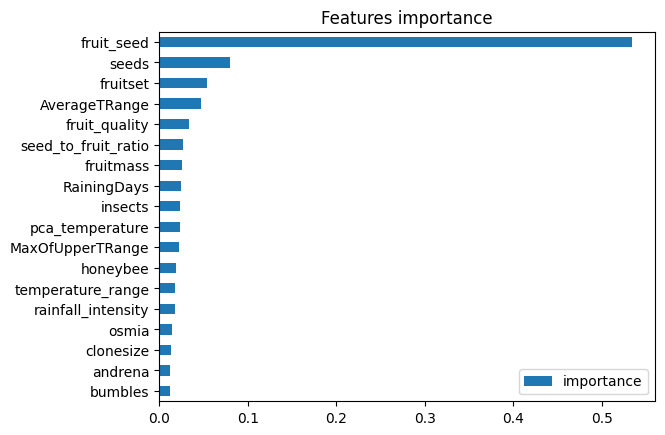

In [12]:
features_importance = pd.DataFrame(model.feature_importances_, index=model.feature_names_in_, columns=['importance'])
features_importance.sort_values('importance').plot(kind='barh', title='Features importance')
plt.show()

In [13]:
test_set = (
    pd.read_csv("/kaggle/input/playground-series-s3e14/test.csv")
    .pipe(generate_features)
    .drop(columns = cols_to_drop)
)

x = test_set.values
x_scaled = MinMaxScaler().fit_transform(x)
test_df_scaled = pd.DataFrame(x_scaled, columns = test_set.columns)
test_df_scaled.head()


,id,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,RainingDays,fruitset,fruitmass,seeds,fruit_seed,insects,AverageTRange,temperature_range,rainfall_intensity,fruit_quality,seed_to_fruit_ratio,pca_temperature
0,0.000000,0.545455,0.013565,0.427350,0.333333,0.333333,0.654618,0.696970,0.396122,0.429817,0.324213,0.285931,0.041103,0.656338,0.414894,0.488912,0.316551,0.288369,0.344334
1,0.000098,0.090909,0.013565,0.427350,1.000000,0.840000,1.000000,0.000000,0.607978,0.585255,0.574107,0.512964,0.086889,1.000000,0.590426,0.000000,0.515338,0.399997,0.000000
2,0.000196,0.090909,0.013565,0.427350,0.840000,0.840000,0.654618,0.454545,0.835721,0.782767,0.720343,0.737031,0.080645,0.656338,0.414894,0.214361,0.769600,0.382230,0.344334
3,0.000294,0.545455,0.027130,0.649573,0.506667,0.840000,0.654618,0.454545,0.476504,0.495780,0.403114,0.361056,0.087409,0.656338,0.414894,0.214361,0.391790,0.313046,0.344334
4,0.000392,1.000000,0.040695,0.427350,0.333333,0.333333,1.000000,0.696970,0.304454,0.343879,0.240040,0.208061,0.067118,1.000000,0.590426,0.488912,0.232045,0.272010,0.000000


In [14]:
predictions = model.predict(test_df_scaled.copy().drop(columns = ["id"]))

In [15]:
test_set["yield"] = predictions
submission_df = test_set[["id", "yield"]]
submission_df.to_csv("submission.csv", index = False)